## Fourier Feature na praktycznym przykładzie

Zainspirowane z https://github.com/ndahlquist/pytorch-fourier-feature-networks/blob/master/demo.ipynb

Celem tego notebooka jest pokazanie że Fourier Feature jest dobrym sposobem na poprawe jakości sieci wykorzystującej jako input zdjęcia.

W tym notebooku zrobimy 2 MLP których zadaniem bedzie zapamiętanie zdjęcia. Zdjęcie importujemy z folderu scr i jest to kotek ;).
Następujące zadania w przyjemny i obrazowy sposób pokażą jak wiele daje Fourier Feature do jakości sieci

In [11]:
import torch
import numpy as np
from torch import nn
from torchvision import transforms
import matplotlib.pyplot as plt
import PIL.Image
from matplotlib import animation
from IPython.display import HTML

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device: {}".format(device))

Using device: cuda


In [12]:
# Ładujemy potrzebne funkcje pomocnicze do tworzenia gifa, importowania zdjęcia z pliku do tensora czy wyświetlania animacji
def get_image():
    """Returns a PIL image"""

    image_path = "src/cat.jpg"
    img = PIL.Image.open(image_path)

    return img

def build_frames(images):
    """Converts a list of images to a list of frames"""

    frames = []
    
    for image in images:
        image = image.transpose(1, 2, 0)
        image = np.clip(image, 0, 1)
        frames.append((image * 255).astype(np.uint8))

    return frames

def display_animation(frames, fps=30, path=None):
    """Displays an animation of the given frames

    Args:
        frames (list): List of frames to animate
        fps (int, optional): Frames per second. Defaults to 30.
        path (str, optional): Path to save the animation. Defaults to None.

    Returns:
        HTML: HTML object to display the animation in Jupyter Notebook
    """

    fig = plt.figure()
    ims = [[plt.imshow(frame, animated=True)] for frame in frames]
    ani = animation.ArtistAnimation(fig, ims, interval=1000/fps, blit=True, repeat_delay=1000)

    if path:
        ani.save(path, writer='pillow')

    html = HTML(ani.to_jshtml())
    plt.close()
    return html

# Image transformation
image_transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
])

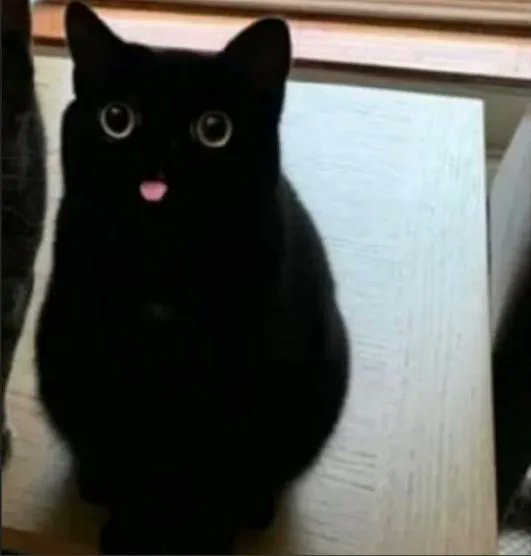

xy_grid shape: torch.Size([1, 2, 512, 512])


In [13]:
# Pokażmy zdjęcie w plocie, a do tego stwórzmy mesza reprezentującego wejście do modelu który za chwile stworzymy
image = get_image()
image.show()
target = image_transform(image).unsqueeze(0).to(device)

# Display target image
coords = np.linspace(0, 1, 512, endpoint=False)
x_coords, y_coords = np.meshgrid(coords, coords)
xy_grid = np.stack([x_coords, y_coords], axis=-1)
xy_grid = torch.from_numpy(xy_grid).permute(2, 0, 1).unsqueeze(0).float().to(device)
print("xy_grid shape: {}".format(xy_grid.shape))

# Model

Nasz model to sieć konwolucyjna z warstwami conv2d oraz rozmiarach jądra (1, 1), które działają jak konwolucje "punktowe".

<br>
<div style="display: flex; justify-content: center;">
<img src="https://user-images.githubusercontent.com/3310961/85066930-ad444580-b164-11ea-9cc0-17494679e71f.png" width="600" />
</div>


In [14]:
class ConvNet(nn.Module):
    def __init__(self, input_size, hidden_size=256, output_size=3):
        super(ConvNet, self).__init__()

        self.conv_block1 = self._conv_block(input_size, hidden_size)
        self.conv_block2 = self._conv_block(hidden_size, hidden_size)
        self.conv_block3 = self._conv_block(hidden_size, hidden_size)

        self.conv4 = nn.Conv2d(hidden_size, output_size, kernel_size=1, padding=0)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)

        return self.sigmoid(self.conv4(x))

    def _conv_block(self, in_channels, out_channels, kernel_size=1, padding=0):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=kernel_size,
                padding=padding),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
        )


def train(model, input, target, epochs=800, lr=1e-4):
    """Trains the given model

    Args:
        model (nn.Module): Model to train
        input (torch.Tensor): Input tensor
        target (torch.Tensor): Target tensor
        epochs (int, optional): Number of epochs. Defaults to 800.
        lr (float, optional): Learning rate. Defaults to 1e-4.

    Returns:
        list: List of images generated by the model during training
    """

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()
    losses = []
    images = []

    for i in range(epochs):
        optimizer.zero_grad()
        output = model(input)
        loss = criterion(output, target)
        losses.append(loss.detach().cpu().item())
        loss.backward()
        optimizer.step()

        if i % 25 == 0:
            images.append(output[0].detach().cpu().numpy())

        if i % 100 == 0:
            print(f"Epoch: {i}, Loss: {loss.item()}")

    print(f"Epoch: {epochs}, Loss: {loss.item()}")

    return images, losses

## MLP z wejściem (x,y)

Epoch: 0, Loss: 0.20011693239212036
Epoch: 100, Loss: 0.0358826220035553
Epoch: 200, Loss: 0.02317660115659237
Epoch: 300, Loss: 0.016831865534186363
Epoch: 400, Loss: 0.012537709437310696
Epoch: 500, Loss: 0.007766162510961294
Epoch: 600, Loss: 0.005643435753881931


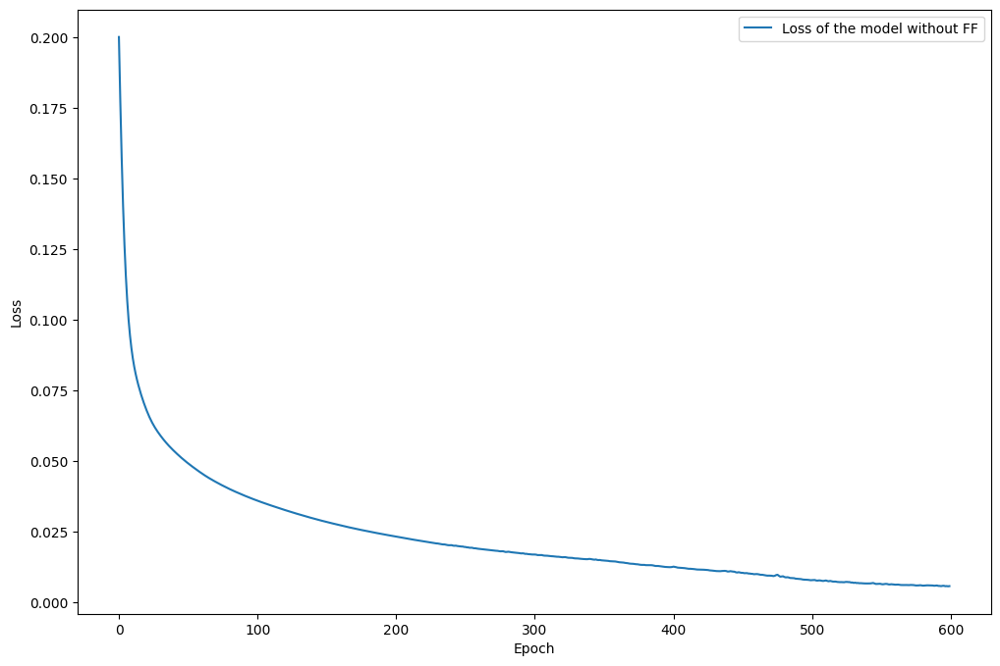

In [15]:
model = ConvNet(input_size=2).to(device)
images_xy, losses = train(model, xy_grid, target, epochs=600, lr=1e-4)
plt.figure(figsize=(12, 8))

plt.plot(losses, label='Loss of the model without FF')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [16]:
frames = build_frames(images_xy)
display_animation(frames, fps=4, path="animation_xy.gif")

## MLP z wejściem przetworzonym przez furier feature
Tensor wejściowy $x$ do sieci jest ładowany z zapisanego pliku, ponieważ waszym zadaniem będzie zaimplementowanie funkcji furier feature. To aby nie spoilerować, nie będziemy pokazywać jak to zrobić :)

In [54]:
def get_furier_transform(x, mapping_size=256, scale=10):
    """
    Args:
        x: tensor of shape [B, C, H, W]
        mapping_size: (L in the lecture notes) number of random fourier features
        scale: scale of the gaussian distribution

    Returns:
        Tensor of shape [B, 2 * mapping_size, H, W]
    """
    # Przeklej tutaj kod z zadania 4 z pliku exercises.ipynb [wykonaj tam zadanie]
    raise NotImplementedError

x shape: torch.Size([1, 256, 512, 512])


Epoch: 0, Loss: 0.17234301567077637
Epoch: 100, Loss: 0.015324071049690247
Epoch: 200, Loss: 0.004761031828820705
Epoch: 300, Loss: 0.0030492711812257767
Epoch: 400, Loss: 0.0023962478153407574
Epoch: 500, Loss: 0.0020606163889169693
Epoch: 600, Loss: 0.0018722335807979107


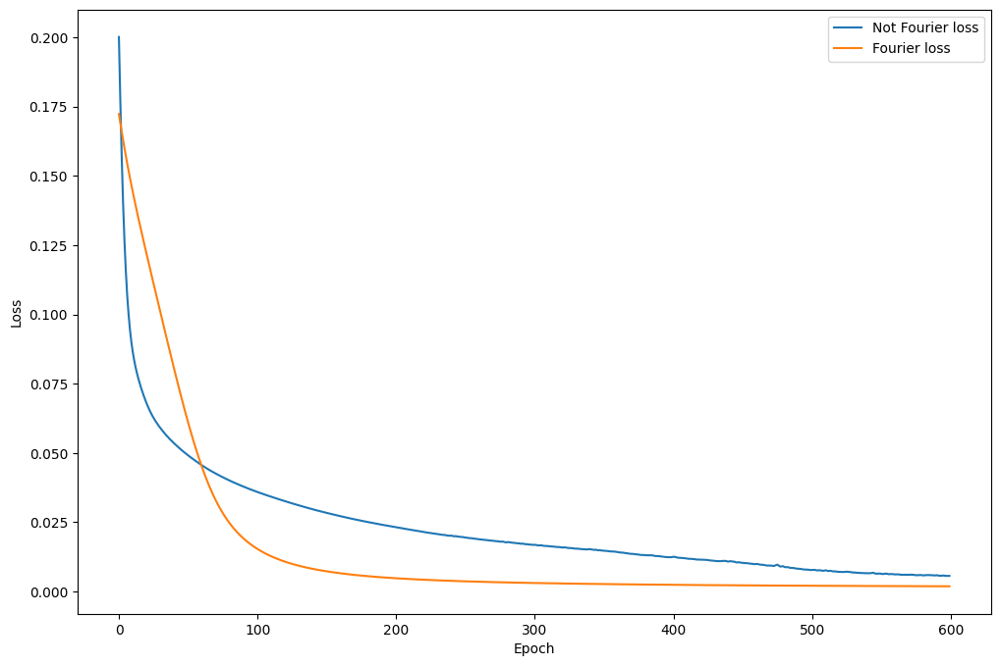

In [53]:
model = ConvNet(input_size=256).to(device)

x = get_furier_transform(xy_grid, mapping_size=128, scale=10)
print(f"x shape: {x.shape}")

images_furier, fourier_losses = train(model, x, target, epochs=600, lr=1e-4)
plt.figure(figsize=(12, 8))

plt.plot(losses, label='Not Fourier loss')
plt.plot(fourier_losses, label='Fourier loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [19]:
frames = build_frames(images_furier)
display_animation(frames, fps=4, path="animation_furier.gif")

## Podsumowanie

Fourier Feature to świetny sposób na poprawienie jakości sieci których inputem jest zdjęcie, lub dane kilkuwymiarowe. Aplikowanie go do modeli jest łatwe, oraz tanie w sensie obliczeniowym oraz nakładu pracy jaki musi zrobić programista aby to działało. Warto o takim rozwiązaniu pamiętać i korzystać z niego.